# Image Dataset Blur Conversion
This notebook consolidates image datasets into a target folder containing two sub-folders:
- `target`: Original images.
- `input`: Blurred versions of the images with configurable blur parameters.

In [1]:
from pathlib import Path
from PIL import Image, ImageFilter
import shutil
import os

# User Configuration
source_folders = [
    # List the paths to dataset folders here.
    '/Users/benpashley/Visual Code/Projects/Openpatho/data/crypts/fullset_500/full_dataset',
]
output_folder = '/Users/benpashley/Visual Code/Projects/Openpatho/histo_deblur_preproc/output'

# Blur Parameters
blur_radius = 5  # Adjust the radius of the blur here.

## Preview Blurred Images
This section previews a few original and blurred images to ensure the settings are correct.

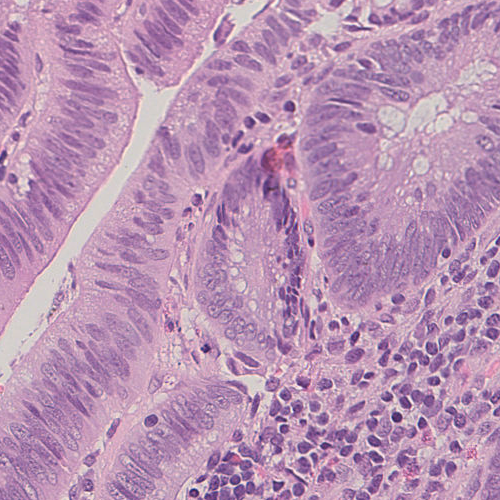

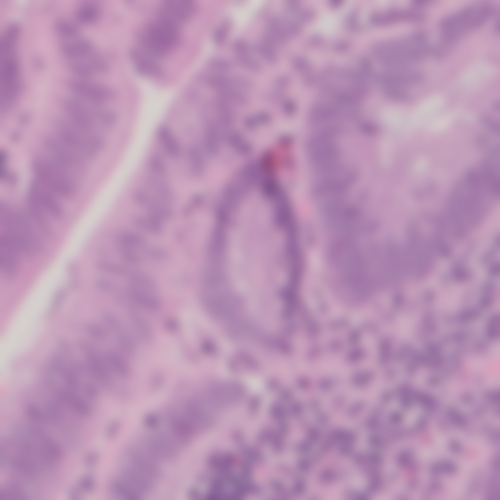

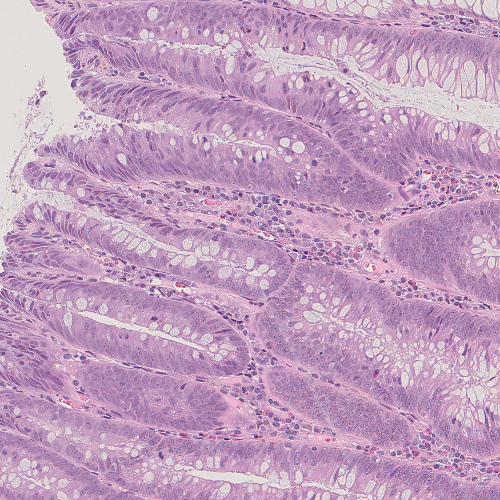

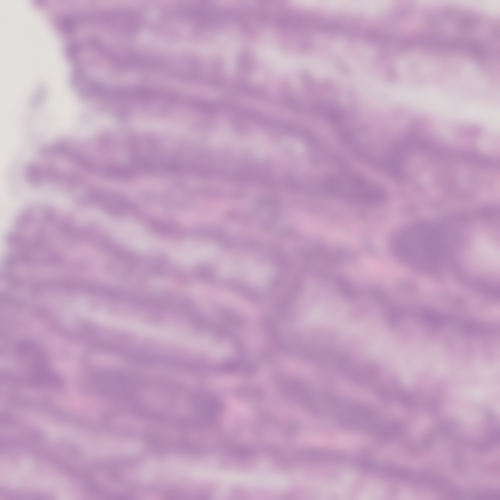

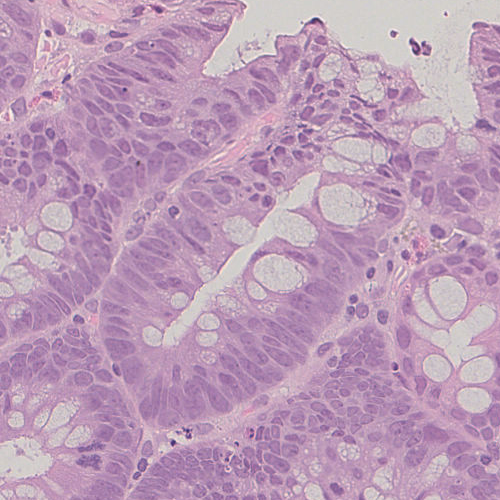

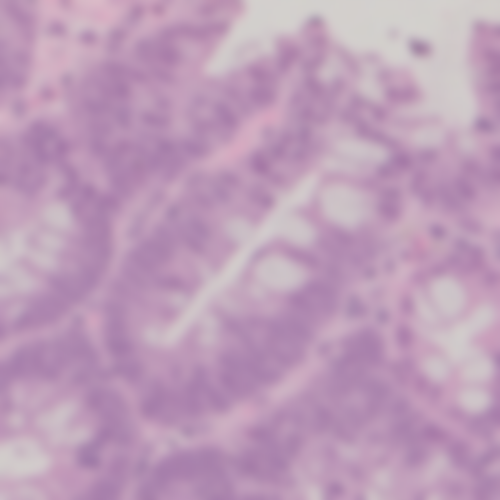

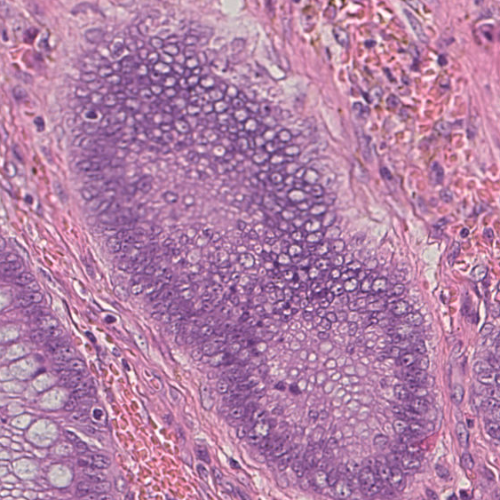

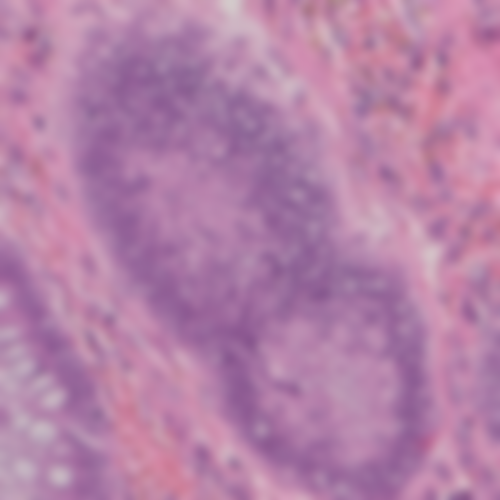

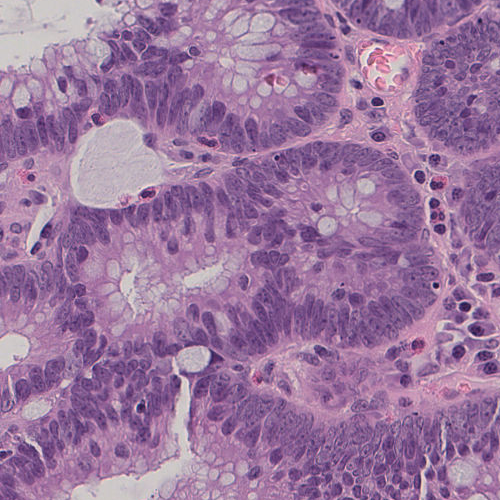

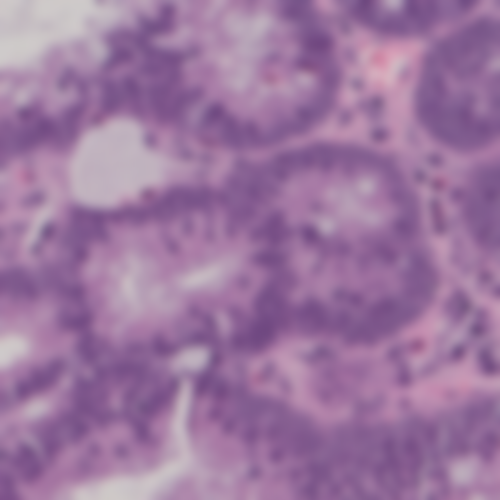

In [2]:
import random

sample_images = []
for folder in source_folders:
    dataset_path = Path(folder)
    for class_folder in dataset_path.iterdir():
        if class_folder.is_dir():
            sample_images.extend(list(class_folder.glob('*.png')))
            if len(sample_images) >= 5:
                break
    if len(sample_images) >= 5:
        break

for img_path in random.sample(sample_images, min(5, len(sample_images))):
    with Image.open(img_path) as img:
        blurred_img = img.filter(ImageFilter.GaussianBlur(blur_radius))
        display(img)
        display(blurred_img)

## Image Processing
This section processes all images and saves them into the consolidated target folder.

In [3]:
# Ensure output folders exist
target_folder = Path(output_folder) / 'target'
input_folder = Path(output_folder) / 'input'
target_folder.mkdir(parents=True, exist_ok=True)
input_folder.mkdir(parents=True, exist_ok=True)

# Process all images
for folder in source_folders:
    dataset_path = Path(folder)
    for class_folder in dataset_path.iterdir():
        if class_folder.is_dir():
            for img_path in class_folder.glob('*'):
                if img_path.suffix.lower() in ['.jpg', '.jpeg', '.png', '.bmp', '.tiff', '.gif', '.webp']:
                    # Generate a flat filename (including class folder name in filename to avoid collisions)
                    flat_filename = f"{class_folder.name}_{img_path.name}"
                    
                    # Paths for target and input files
                    target_img_path = target_folder / flat_filename
                    input_img_path = input_folder / flat_filename

                    # Skip if both files already exist
                    if target_img_path.exists() and input_img_path.exists():
                        print(f"Skipping {flat_filename}: files already exist.")
                        continue
                    
                    # Save original image if it doesn't exist
                    if not target_img_path.exists():
                        shutil.copy(img_path, target_img_path)

                    # Save blurred image if it doesn't exist
                    if not input_img_path.exists():
                        with Image.open(img_path) as img:
                            blurred_img = img.filter(ImageFilter.GaussianBlur(blur_radius))
                            blurred_img.save(input_img_path)

print("Processing complete. Images saved to:", output_folder)

Skipping Adenoma_c7d0ef3e-a533-4493-b40f-a12a763129ce.png: files already exist.
Skipping Adenoma_d2add833-a59d-4e8f-8b84-12ccca7dc3bf.png: files already exist.
Skipping Adenoma_37fd138c-56d2-40e1-9aa8-bdd6e6675aa4.png: files already exist.
Skipping Adenoma_f291aaa0-8af6-4e16-98cb-659f1c9e0587.png: files already exist.
Skipping Adenoma_a78fa37c-11df-4487-9559-35ce0720dc2e.png: files already exist.
Skipping Adenoma_e0a2f461-a8da-4bf4-8ac0-656c1e594c09.png: files already exist.
Skipping Adenoma_5bc74eb7-e2a5-429c-86b9-036501c53981.png: files already exist.
Skipping Adenoma_d96ac8e8-11bb-448e-865b-4559b15bd661.png: files already exist.
Skipping Adenoma_1b642a37-2a00-468f-8f08-6f1a2a7ae22d.png: files already exist.
Skipping Adenoma_047593a6-324b-487c-93ec-f108d56b030b.png: files already exist.
Skipping Adenoma_92a903b0-4e87-4432-ba4c-595a558ffa66.png: files already exist.
Skipping Adenoma_cb70a63b-38ec-4e10-b4fc-7d132780c903.png: files already exist.
Skipping Adenoma_f7893ec0-acd0-4856-902d

In [5]:
import random
from shutil import copy, rmtree

# User Configuration
train_folder = Path(output_folder) / 'train'
train_target_folder = train_folder / 'target'
train_input_folder = train_folder / 'input'
val_folder = Path(output_folder) / 'val'
val_target_folder = val_folder / 'target'
val_input_folder = val_folder / 'input'
val_percentage = 5  # Percentage of images for validation set

# Remove existing train and val folders if they exist
for folder in [train_folder, val_folder]:
    if folder.exists():
        rmtree(folder)

# Recreate train and val folder structure
for folder in [train_target_folder, train_input_folder, val_target_folder, val_input_folder]:
    folder.mkdir(parents=True, exist_ok=True)

# Get all images from the 'target' folder
all_images = list(target_folder.glob('*'))

# Calculate number of validation images
val_count = int(len(all_images) * (val_percentage / 100))

# Randomly split images into train and val sets
random.shuffle(all_images)
val_images = all_images[:val_count]
train_images = all_images[val_count:]

# Copy images to train and val folders
def copy_images(image_list, target_dir, input_dir):
    for img_path in image_list:
        # Copy the target image
        target_dest = target_dir / img_path.name
        copy(img_path, target_dest)

        # Copy the corresponding input image
        input_img_path = input_folder / img_path.name
        input_dest = input_dir / img_path.name
        copy(input_img_path, input_dest)

# Process train and val sets
copy_images(train_images, train_target_folder, train_input_folder)
copy_images(val_images, val_target_folder, val_input_folder)

print(f"Training set created with {len(train_images)} images.")
print(f"Validation set created with {len(val_images)} images.")

Training set created with 45625 images.
Validation set created with 2401 images.
